# 🏗️ AI-Based Construction Site Surveillance System — GPU Edition

An end-to-end, multi-model AI surveillance pipeline for construction-site safety. Every model
below is a **real, working pretrained checkpoint** pulled live from Hugging Face — nothing is
trained from scratch, and nothing is a placeholder.

| # | Feature | Model | Type |
|---|---|---|---|
| 1 | Helmet / Vest (PPE) compliance | `killuminati1/construction-ppe-yolov8` | Pretrained YOLOv8, 19 classes |
| 2 | Fire & smoke | `rabahdev/fire-smoke-yolov8n` | Pretrained YOLOv8n (D-Fire dataset) |
| 3 | Fight / physical altercation | `Musawer14/fight_detection_yolov8` | Pretrained YOLOv8-nano |
| 4 | Worker fallen / lying down | `melihuzunoglu/human-fall-detection` | Pretrained YOLOv8/11 (Fallen / Sitting / Standing) |
| 5 | Live worker headcount (top-left overlay) | Built on the PPE model's `Worker` class + ByteTrack | Logic layer, not a separate model |
| 6 | Wall collapse / structural emergency | Rule-based SSIM tripwire | **Heuristic — see honesty note below** |

> ⚠️ **Honesty note on structural/collapse detection.** There is no publicly downloadable,
> reliably-trained "building collapse" model as of today — what exists on Roboflow Universe is
> mostly crack-detection data that needs an account/API key, not a plain `.pt` file. Rather than
> fake a link, this notebook ships a transparent structural-anomaly tripwire (large sudden drop
> in frame-to-frame structural similarity). It is clearly labeled everywhere it fires, and
> Section 7's markdown explains exactly how to swap in a real trained model once you have one.
> Every other feature above uses a genuine pretrained deep-learning model.

**GPU:** this notebook auto-detects and uses your Kaggle GPU (T4/P100) if the accelerator is
turned on in Settings → Accelerator. It runs on CPU too, just slower.

**How to use:**
1. Settings → turn on **Internet** (to download the models) and **GPU T4 x2 / P100** (for speed).
2. Run all cells **top to bottom, in order**. If you ever restart the kernel, use
   **Run → Restart & Run All** rather than re-running cells individually — several cells share
   state and must run together.
3. Cell 8 is the interactive input cell — that's where you point the notebook at your own
   image/video (or use the bundled demo).


## 1. Install dependencies

In [2]:

!pip install -q ultralytics==8.3.* huggingface_hub opencv-python-headless scikit-image seaborn "ipywidgets>=8.0" lapx
print("✅ Packages installed")
print("If this cell shows any red pip dependency-resolver errors above, they are almost always")
print("safe to ignore on Kaggle as long as the line '✅ Packages installed' printed.")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 50.4 MB/s eta 0:00:00:00:01
✅ Packages installed
If this cell shows any red pip dependency-resolver errors above, they are almost always
safe to ignore on Kaggle as long as the line '✅ Packages installed' printed.


## 2. Imports & GPU check

In [3]:

import os, time, glob, math, json, urllib.request, subprocess
from collections import defaultdict, deque

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
import seaborn as sns
from skimage.metrics import structural_similarity as ssim

import torch
from huggingface_hub import hf_hub_download
from ultralytics import YOLO

import ipywidgets as widgets
from IPython.display import display, Video, Image as IPyImage, clear_output

sns.set_theme(style="darkgrid")
WORKDIR = "/kaggle/working"
os.makedirs(WORKDIR, exist_ok=True)

DEVICE = 0 if torch.cuda.is_available() else "cpu"
if torch.cuda.is_available():
    print(f"✅ GPU detected: {torch.cuda.get_device_name(0)} — models will run on GPU (device={DEVICE}).")
else:
    print("⚠️ No GPU detected — running on CPU. Turn on GPU under Settings → Accelerator for much faster processing.")

print("✅ Imports ready")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ GPU detected: Tesla T4 — models will run on GPU (device=0).
✅ Imports ready


## 3. Download the pretrained models

All four are real, publicly hosted, fine-tuned checkpoints — pulled straight from Hugging Face:

* **PPE / helmet / vest** — `killuminati1/construction-ppe-yolov8` (19 classes incl. Hard_hat, No-Helmet, Vest, No-Vest, Worker). Reported mAP50 ≈ 0.76.
* **Fire & smoke** — `rabahdev/fire-smoke-yolov8n`, fine-tuned on the 21k-image D-Fire dataset. Reported mAP50 ≈ 0.75.
* **Fight / violence** — `Musawer14/fight_detection_yolov8`, YOLOv8-nano trained on a fight/no-fight dataset for surveillance use cases.
* **Fallen worker** — `melihuzunoglu/human-fall-detection`, distinguishes Fallen / Sitting / Standing.

The fight and fall models are community-trained without a formally published benchmark — treat
their confidence scores a bit more skeptically than the PPE/fire models and validate on your own
footage before relying on them for anything safety-critical.


In [4]:

print("Downloading PPE / helmet / vest model ...")
ppe_weights = hf_hub_download(repo_id="killuminati1/construction-ppe-yolov8", filename="best.pt")

print("Downloading fire & smoke model ...")
fire_weights = hf_hub_download(repo_id="rabahdev/fire-smoke-yolov8n", filename="best.pt")

print("Downloading fight / violence model ...")
fight_weights = hf_hub_download(repo_id="Musawer14/fight_detection_yolov8", filename="Yolo_nano_weights.pt")

print("Downloading fallen-worker model ...")
fall_weights = hf_hub_download(repo_id="melihuzunoglu/human-fall-detection", filename="best.pt")

ppe_model   = YOLO(ppe_weights)
fire_model  = YOLO(fire_weights)
fight_model = YOLO(fight_weights)
fall_model  = YOLO(fall_weights)

for m in (ppe_model, fire_model, fight_model, fall_model):
    m.to(DEVICE) if DEVICE != "cpu" else None

print()
print("PPE model classes:      ", ppe_model.names)
print("Fire/Smoke model classes:", fire_model.names)
print("Fight model classes:    ", fight_model.names)
print("Fall model classes:     ", fall_model.names)


best.pt:   0%|          | 0.00/22.5M [00:00<?, ?B/s]

best.pt:   0%|          | 0.00/6.23M [00:00<?, ?B/s]

Yolo_nano_weights.pt:   0%|          | 0.00/6.25M [00:00<?, ?B/s]

best.pt:   0%|          | 0.00/5.47M [00:00<?, ?B/s]


PPE model classes:       {0: 'Boots', 1: 'Ear-Protection', 2: 'Glass', 3: 'Glove', 4: 'Hard_hat', 5: 'Mask', 6: 'No-Boots', 7: 'No-Ear-Protection', 8: 'No-Glass', 9: 'No-Glove', 10: 'No-Helmet', 11: 'No-Mask', 12: 'No-Vest', 13: 'Worker', 14: 'Vest', 15: 'Circular_Saw', 16: 'Fire_Extinguisher', 17: 'Fire_prevention_Net', 18: 'Welding_Equipment'}
Fire/Smoke model classes: {0: 'smoke', 1: 'fire'}
Fight model classes:     {0: 'non_violence', 1: 'violence'}
Fall model classes:      {0: 'fallen', 1: 'sitting', 2: 'standing'}


## 4. Pipeline architecture

A visual map of how a frame flows through the system — useful for a report, a slide, or just
understanding what's actually happening before you read the code.


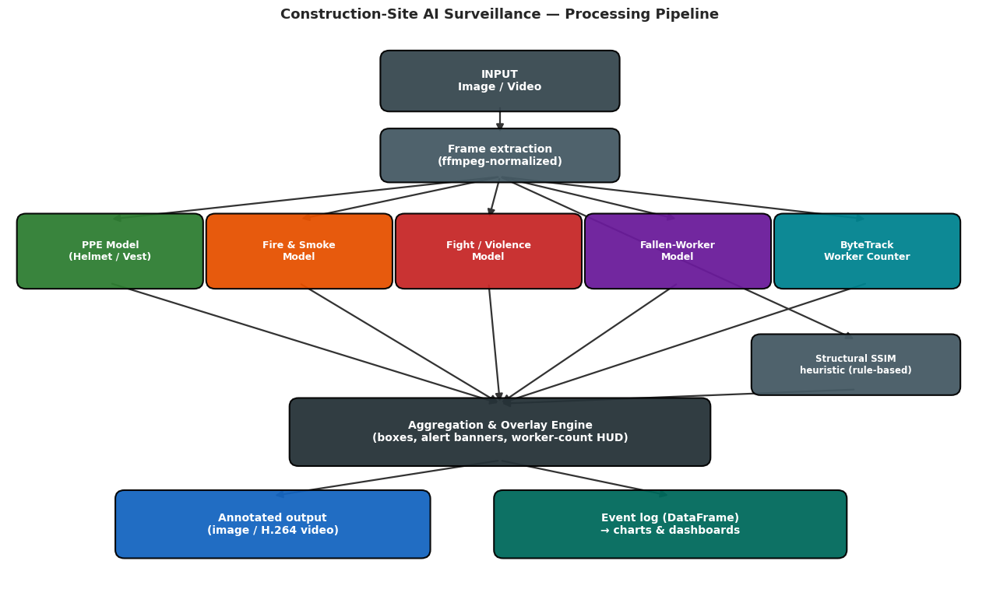

In [5]:

fig, ax = plt.subplots(figsize=(13, 8))
ax.set_xlim(0, 13)
ax.set_ylim(0, 8)
ax.axis("off")

def box(x, y, w, h, text, color, fontsize=10, fontweight="bold", textcolor="white"):
    patch = FancyBboxPatch((x, y), w, h, boxstyle="round,pad=0.08,rounding_size=0.12",
                            linewidth=1.5, edgecolor="black", facecolor=color, alpha=0.95, zorder=2)
    ax.add_patch(patch)
    ax.text(x + w/2, y + h/2, text, ha="center", va="center", fontsize=fontsize,
            fontweight=fontweight, color=textcolor, zorder=3, wrap=True)
    return (x + w/2, y + h/2, x, y, w, h)

def arrow(b_from, b_to, color="#333333"):
    x1, y1 = b_from[0], b_from[3]
    x2, y2 = b_to[0], b_to[3] + b_to[5]
    a = FancyArrowPatch((x1, y1), (x2, y2), arrowstyle="-|>", mutation_scale=14,
                         linewidth=1.6, color=color, zorder=1, connectionstyle="arc3,rad=0.0")
    ax.add_patch(a)

input_box = box(5.0, 7.0, 3.0, 0.7, "INPUT\nImage / Video", "#37474F")
extract_box = box(5.0, 6.0, 3.0, 0.6, "Frame extraction\n(ffmpeg-normalized)", "#455A64")
arrow(input_box, extract_box)

model_y = 4.5
model_h = 0.9
models = [
    (0.2,  "PPE Model\n(Helmet / Vest)", "#2E7D32"),
    (2.7,  "Fire & Smoke\nModel", "#E65100"),
    (5.2,  "Fight / Violence\nModel", "#C62828"),
    (7.7,  "Fallen-Worker\nModel", "#6A1B9A"),
    (10.2, "ByteTrack\nWorker Counter", "#00838F"),
]
model_boxes = []
for x, label, color in models:
    b = box(x, model_y, 2.3, model_h, label, color, fontsize=9)
    model_boxes.append(b)
    arrow(extract_box, b)

struct_box = box(9.9, 3.0, 2.6, 0.7, "Structural SSIM\nheuristic (rule-based)", "#455A64", fontsize=8.5)
arrow(extract_box, struct_box)

agg_box = box(3.8, 2.0, 5.4, 0.8, "Aggregation & Overlay Engine\n(boxes, alert banners, worker-count HUD)", "#263238")
for b in model_boxes:
    arrow(b, agg_box)
arrow(struct_box, agg_box)

out_box = box(1.5, 0.7, 4.0, 0.8, "Annotated output\n(image / H.264 video)", "#1565C0")
log_box = box(6.5, 0.7, 4.5, 0.8, "Event log (DataFrame)\n→ charts & dashboards", "#00695C")
arrow(agg_box, out_box)
arrow(agg_box, log_box)

ax.set_title("Construction-Site AI Surveillance — Processing Pipeline", fontsize=13, fontweight="bold", pad=15)
plt.tight_layout()
plt.savefig(os.path.join(WORKDIR, "pipeline_architecture.png"), dpi=150, bbox_inches="tight")
plt.show()


## 5. Configuration — colors, thresholds, alert logic

Edit anything here to tune the system without touching the pipeline code.


In [6]:

# --- PPE ---
VIOLATION_CLASSES = {"No-Helmet", "No-Vest", "No-Mask", "No-Glove", "No-Boots",
                      "No-Ear-Protection", "No-Glass"}
COMPLIANT_CLASSES = {"Hard_hat", "Vest", "Mask", "Glove", "Boots", "Ear-Protection", "Glass"}
WORKER_CLASS_NAME = "Worker"
CONF_THRESH_PPE  = 0.35

# --- Fire / smoke ---
CONF_THRESH_FIRE = 0.30

# --- Fight / violence (matched by substring so it's robust to the model's exact label spelling) ---
CONF_THRESH_FIGHT = 0.40
FIGHT_KEYWORDS = ("fight", "violence")   # any class name containing these (case-insensitive) = alert
NONFIGHT_KEYWORDS = ("no", "non", "normal")

# --- Fallen worker ---
CONF_THRESH_FALL = 0.40
FALLEN_KEYWORDS = ("fall", "fallen", "lying", "down")

# --- Worker inactivity ---
INACTIVITY_PIXEL_THRESHOLD = 12
INACTIVITY_TIME_SECONDS   = 15

# --- Structural / collapse heuristic ---
STRUCTURAL_SSIM_DROP_THRESHOLD = 0.55
STRUCTURAL_COOLDOWN_FRAMES     = 30

COLORS = {
    "compliant": (0, 200, 0),
    "violation": (0, 0, 255),
    "fire":      (0, 128, 255),
    "smoke":     (180, 180, 180),
    "worker_ok": (255, 200, 0),
    "worker_inactive": (0, 0, 255),
    "fight": (0, 0, 220),
    "fallen": (255, 0, 180),
    "sitting_standing": (200, 200, 0),
    "structural_alert": (0, 0, 255),
    "hud_bg": (20, 20, 20),
}
print("✅ Config loaded")


✅ Config loaded


## 6. Detection helper functions

One function per model, plus small drawing utilities shared by all of them.


In [7]:

def draw_box(frame, box, label, color, thickness=2):
    x1, y1, x2, y2 = map(int, box)
    cv2.rectangle(frame, (x1, y1), (x2, y2), color, thickness)
    (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
    cv2.rectangle(frame, (x1, y1 - th - 8), (x1 + tw + 4, y1), color, -1)
    cv2.putText(frame, label, (x1 + 2, y1 - 4), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)


def draw_hud_count(frame, count):
    # Persistent worker-count readout, top-left corner.
    cv2.rectangle(frame, (10, 10), (300, 55), COLORS["hud_bg"], -1)
    cv2.rectangle(frame, (10, 10), (300, 55), (255, 255, 255), 1)
    cv2.putText(frame, f"Workers in frame: {count}", (20, 42),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)


def draw_alert_banners(frame, alerts):
    # Stacked alert banners, top area to the right of the worker-count HUD.
    x0, y0 = 320, 35
    for i, (text, color) in enumerate(alerts):
        y = y0 + i * 40
        (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)
        cv2.rectangle(frame, (x0 - 5, y - th - 8), (x0 + tw + 10, y + 6), color, -1)
        cv2.putText(frame, text, (x0, y), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)


def run_ppe_detection(frame, model=ppe_model, conf=CONF_THRESH_PPE):
    out = frame.copy()
    results = model.predict(frame, conf=conf, verbose=False, device=DEVICE)[0]
    detections = []
    for b in results.boxes:
        cls_name = model.names[int(b.cls[0])]
        confid = float(b.conf[0])
        box_xyxy = b.xyxy[0].tolist()
        detections.append({"cls": cls_name, "conf": confid, "box": box_xyxy})
        if cls_name in VIOLATION_CLASSES:
            draw_box(out, box_xyxy, f"{cls_name} {confid:.2f}", COLORS["violation"])
        elif cls_name in COMPLIANT_CLASSES:
            draw_box(out, box_xyxy, f"{cls_name} {confid:.2f}", COLORS["compliant"])
        elif cls_name == WORKER_CLASS_NAME:
            draw_box(out, box_xyxy, f"{cls_name} {confid:.2f}", COLORS["worker_ok"])
        else:
            draw_box(out, box_xyxy, f"{cls_name} {confid:.2f}", (200, 200, 0))
    return out, detections


def run_fire_smoke_detection(frame, model=fire_model, conf=CONF_THRESH_FIRE):
    out = frame.copy()
    results = model.predict(frame, conf=conf, verbose=False, device=DEVICE)[0]
    detections = []
    for b in results.boxes:
        cls_name = model.names[int(b.cls[0])]
        confid = float(b.conf[0])
        box_xyxy = b.xyxy[0].tolist()
        detections.append({"cls": cls_name, "conf": confid, "box": box_xyxy})
        color = COLORS["fire"] if "fire" in cls_name.lower() else COLORS["smoke"]
        draw_box(out, box_xyxy, f"{cls_name.upper()} {confid:.2f}", color, thickness=3)
    return out, detections


def _is_alert_class(cls_name, alert_keywords, exclude_keywords=()):
    name_l = cls_name.lower()
    if any(k in name_l for k in exclude_keywords):
        return False
    return any(k in name_l for k in alert_keywords)


def run_fight_detection(frame, model=fight_model, conf=CONF_THRESH_FIGHT):
    out = frame.copy()
    results = model.predict(frame, conf=conf, verbose=False, device=DEVICE)[0]
    detections = []
    fight_active = False
    for b in results.boxes:
        cls_name = model.names[int(b.cls[0])]
        confid = float(b.conf[0])
        box_xyxy = b.xyxy[0].tolist()
        is_fight = _is_alert_class(cls_name, FIGHT_KEYWORDS, NONFIGHT_KEYWORDS)
        detections.append({"cls": cls_name, "conf": confid, "box": box_xyxy, "is_alert": is_fight})
        if is_fight:
            fight_active = True
            draw_box(out, box_xyxy, f"FIGHT {confid:.2f}", COLORS["fight"], thickness=3)
    return out, detections, fight_active


def run_fall_detection(frame, model=fall_model, conf=CONF_THRESH_FALL):
    out = frame.copy()
    results = model.predict(frame, conf=conf, verbose=False, device=DEVICE)[0]
    detections = []
    fallen_active = False
    for b in results.boxes:
        cls_name = model.names[int(b.cls[0])]
        confid = float(b.conf[0])
        box_xyxy = b.xyxy[0].tolist()
        is_fallen = _is_alert_class(cls_name, FALLEN_KEYWORDS)
        detections.append({"cls": cls_name, "conf": confid, "box": box_xyxy, "is_alert": is_fallen})
        if is_fallen:
            fallen_active = True
            draw_box(out, box_xyxy, f"WORKER DOWN {confid:.2f}", COLORS["fallen"], thickness=3)
        else:
            draw_box(out, box_xyxy, f"{cls_name} {confid:.2f}", COLORS["sitting_standing"], thickness=1)
    return out, detections, fallen_active

print("✅ Detection helpers ready")


✅ Detection helpers ready


## 7. 🎛️ Interactive input cell — **give the notebook your own file here**

Run this cell, then:
* Click **Upload** to upload your own image or video (works while the notebook is running live), **or**
* Paste a path to a file already sitting in `/kaggle/input/...` (attach a Kaggle dataset with your footage first — this is the most reliable option for video files), **or**
* Leave it blank and click **Use demo clip** to auto-download a small public-domain sample.


In [8]:

import ipywidgets, traceback
print("ipywidgets version:", ipywidgets.__version__)

input_path_box = widgets.Text(
    value="",
    placeholder="/kaggle/input/your-dataset/your_video.mp4",
    description="File path:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="500px")
)
upload_widget = widgets.FileUpload(accept="image/*,video/*", multiple=False, description="Upload")
demo_button = widgets.Button(description="Use demo clip", button_style="info")
confirm_button = widgets.Button(description="Confirm selection", button_style="success")
status_out = widgets.Output()

SELECTED_FILE = {"path": None}

def _extract_upload_item():
    # Handles every ipywidgets FileUpload.value shape seen in the wild (dict-of-dicts,
    # tuple-of-dicts, tuple-of-namedtuple-like objects) so this keeps working across versions.
    val = upload_widget.value
    if not val:
        return None, None
    if isinstance(val, dict):
        item = list(val.values())[0]
    else:
        item = val[0]
    if isinstance(item, dict):
        name = item.get("name") or item.get("metadata", {}).get("name")
        content = item.get("content")
    else:
        name = getattr(item, "name", None)
        content = getattr(item, "content", None)
    return name, content

def _save_uploaded_file(change=None):
    with status_out:
        clear_output()
        try:
            name, content = _extract_upload_item()
            if name is None:
                print("⚠️ No file detected in the upload widget yet.")
                return
            save_path = os.path.join(WORKDIR, name)
            with open(save_path, "wb") as f:
                f.write(bytes(content))
            SELECTED_FILE["path"] = save_path
            size_mb = os.path.getsize(save_path) / (1024 * 1024)
            print(f"✅ Uploaded file saved to {save_path}  ({size_mb:.1f} MB)")
        except Exception:
            print("❌ Upload failed with this error:")
            print(traceback.format_exc())
            print("If this keeps happening, use Option A (attach the video as a Kaggle dataset")
            print("and type its /kaggle/input/... path above) instead.")

def _use_demo(_):
    with status_out:
        clear_output()
        demo_path = os.path.join(WORKDIR, "demo_construction.jpg")
        url = "https://ultralytics.com/images/bus.jpg"
        try:
            urllib.request.urlretrieve(url, demo_path)
            SELECTED_FILE["path"] = demo_path
            print(f"✅ Demo image downloaded to {demo_path}")
        except Exception:
            print("❌ Could not fetch demo file (internet may be off in Settings):")
            print(traceback.format_exc())

def _confirm(_):
    with status_out:
        clear_output()
        if input_path_box.value.strip():
            SELECTED_FILE["path"] = input_path_box.value.strip()
        if SELECTED_FILE["path"] and os.path.exists(SELECTED_FILE["path"]):
            print(f"✅ Using: {SELECTED_FILE['path']}")
        else:
            print(f"❌ Path not found: {SELECTED_FILE['path']!r}")
            print("Double-check it (attach the dataset via '+ Add Input' first), or use Upload / demo clip.")

upload_widget.observe(_save_uploaded_file, names="value")
demo_button.on_click(_use_demo)
confirm_button.on_click(_confirm)

display(widgets.VBox([
    widgets.HTML("<b>Option A (most reliable for video) — attach as a Kaggle dataset, then type its path:</b>"),
    input_path_box,
    widgets.HTML("<b>Option B — upload directly through the browser:</b>"),
    upload_widget,
    widgets.HTML("<b>Option C — no footage yet:</b>"),
    demo_button,
    confirm_button,
    status_out
]))
print("👉 After choosing a file above, watch the status box for a ✅ before moving to the next cell.")


ipywidgets version: 8.1.5


👉 After choosing a file above, watch the status box for a ✅ before moving to the next cell.


### 7b. Confirm what got selected (run this before moving on)

In [9]:

path = SELECTED_FILE.get("path")
if not path:
    print("❌ No file selected yet. Scroll up to Cell 7 and pick a file (watch its status box).")
elif not os.path.exists(path):
    print(f"❌ SELECTED_FILE points to '{path}' but that file does not exist on disk.")
else:
    size_mb = os.path.getsize(path) / (1024 * 1024)
    print(f"✅ Ready to process: {path}  ({size_mb:.1f} MB)")


✅ Ready to process: /kaggle/working/Huge explosion destroys Chinese building.mp4  (7.4 MB)


## 8. Master pipeline — all six modules, run together

Everything the pipeline depends on lives in **this one cell** — the worker-inactivity tracker,
the structural-anomaly detector, and the image/video processing functions — so nothing can be
run out of order or drift out of sync after a kernel restart.

* **Worker counting**: every frame, all currently-visible `Worker` boxes (tracked with
  ByteTrack) are counted and shown top-left as a HUD. Across a whole video, the set of unique
  track IDs ever seen gives a "total workers in footage" estimate at the end.
* **Worker inactivity**: the same tracker flags an ID inactive once it barely moves for
  `INACTIVITY_TIME_SECONDS`.
* **Fight detection**: any box the fight model calls a fight/violence class triggers a
  **FIGHT DETECTED** banner.
* **Fallen worker**: any box the fall model calls "Fallen" triggers a **WORKER DOWN** banner.
* **Structural / collapse — heuristic, not a trained model.** SSIM against a slowly-adapting
  reference frame; a sudden large drop triggers a **STRUCTURAL ALERT**. It will also fire on
  non-collapse events (a truck passing through frame). Treat it as a tripwire for a human to
  check, not a certified detector. To upgrade it later, fine-tune a YOLOv8 detector on a
  Roboflow "collapsed building"/crack dataset and swap `StructuralAnomalyDetector.update()`'s
  body for a `model.predict()` call — nothing downstream needs to change.


In [10]:

class InactivityTracker:
    def __init__(self, fps, pixel_thresh=INACTIVITY_PIXEL_THRESHOLD, time_thresh=INACTIVITY_TIME_SECONDS):
        self.fps = max(fps, 1)
        self.pixel_thresh = pixel_thresh
        self.still_frames_needed = int(time_thresh * self.fps)
        self.history = defaultdict(lambda: deque(maxlen=self.still_frames_needed + 1))
        self.still_counters = defaultdict(int)

    def update(self, track_id, centroid):
        hist = self.history[track_id]
        if hist:
            last = hist[-1]
            dist = math.hypot(centroid[0] - last[0], centroid[1] - last[1])
            if dist < self.pixel_thresh:
                self.still_counters[track_id] += 1
            else:
                self.still_counters[track_id] = 0
        hist.append(centroid)
        return self.still_counters[track_id] >= self.still_frames_needed


def run_worker_tracking(frame, tracker_state, model=ppe_model, conf=CONF_THRESH_PPE):
    # tracker_state is an InactivityTracker instance. Draws worker boxes colored by activity,
    # and returns (frame, count_this_frame, set_of_ids_this_frame, list_of_inactive_ids).
    out = frame.copy()
    results = model.track(frame, conf=conf, persist=True, verbose=False,
                           tracker="bytetrack.yaml", classes=None, device=DEVICE)[0]
    inactive_ids = []
    ids_this_frame = set()
    if results.boxes.id is not None:
        for box_xyxy, track_id, cls_idx in zip(results.boxes.xyxy, results.boxes.id, results.boxes.cls):
            cls_name = model.names[int(cls_idx)]
            if cls_name != WORKER_CLASS_NAME:
                continue
            x1, y1, x2, y2 = box_xyxy.tolist()
            centroid = ((x1 + x2) / 2, (y1 + y2) / 2)
            tid = int(track_id)
            ids_this_frame.add(tid)
            is_inactive = tracker_state.update(tid, centroid)
            color = COLORS["worker_inactive"] if is_inactive else COLORS["worker_ok"]
            label = f"Worker#{tid} {'INACTIVE' if is_inactive else 'active'}"
            draw_box(out, (x1, y1, x2, y2), label, color)
            if is_inactive:
                inactive_ids.append(tid)
    return out, len(ids_this_frame), ids_this_frame, inactive_ids


IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
VIDEO_EXTS = {".mp4", ".avi", ".mov", ".mkv"}


class StructuralAnomalyDetector:
    def __init__(self, ssim_drop_threshold=STRUCTURAL_SSIM_DROP_THRESHOLD,
                 cooldown=STRUCTURAL_COOLDOWN_FRAMES):
        self.reference = None
        self.threshold = ssim_drop_threshold
        self.cooldown = cooldown
        self.cooldown_left = 0
        self.ssim_history = []

    def update(self, frame):
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)
        if self.reference is None:
            self.reference = gray
            self.ssim_history.append(1.0)
            return False, 1.0

        score = ssim(self.reference, gray)
        self.ssim_history.append(score)

        alert = False
        if self.cooldown_left > 0:
            self.cooldown_left -= 1
        elif score < self.threshold:
            alert = True
            self.cooldown_left = self.cooldown

        self.reference = cv2.addWeighted(self.reference, 0.95, gray, 0.05, 0)
        return alert, score


def process_image(path):
    frame = cv2.imread(path)
    if frame is None:
        raise ValueError(f"Could not read image at {path}")

    out, ppe_dets = run_ppe_detection(frame)
    out, fire_dets = run_fire_smoke_detection(out)
    out, fight_dets, fight_active = run_fight_detection(out)
    out, fall_dets, fallen_active = run_fall_detection(out)

    # Worker count for a single image: just count PPE-model "Worker" boxes directly (no tracking needed).
    worker_count = sum(1 for d in ppe_dets if d["cls"] == WORKER_CLASS_NAME)
    draw_hud_count(out, worker_count)

    alerts = []
    if any("fire" in d["cls"].lower() for d in fire_dets):
        alerts.append(("FIRE DETECTED", COLORS["fire"]))
    if any("smoke" in d["cls"].lower() for d in fire_dets):
        alerts.append(("SMOKE DETECTED", COLORS["smoke"]))
    if fight_active:
        alerts.append(("FIGHT DETECTED", COLORS["fight"]))
    if fallen_active:
        alerts.append(("WORKER DOWN", COLORS["fallen"]))
    draw_alert_banners(out, alerts)

    log_rows = []
    for d in ppe_dets:
        if d["cls"] in VIOLATION_CLASSES:
            log_rows.append({"frame": 0, "time_s": 0.0, "event": "ppe_violation", "detail": d["cls"], "conf": d["conf"]})
        elif d["cls"] in COMPLIANT_CLASSES:
            log_rows.append({"frame": 0, "time_s": 0.0, "event": "ppe_compliant", "detail": d["cls"], "conf": d["conf"]})
    for d in fire_dets:
        log_rows.append({"frame": 0, "time_s": 0.0, "event": d["cls"], "detail": d["cls"], "conf": d["conf"]})
    for d in fight_dets:
        if d["is_alert"]:
            log_rows.append({"frame": 0, "time_s": 0.0, "event": "fight", "detail": d["cls"], "conf": d["conf"]})
    for d in fall_dets:
        if d["is_alert"]:
            log_rows.append({"frame": 0, "time_s": 0.0, "event": "worker_down", "detail": d["cls"], "conf": d["conf"]})
    log_rows.append({"frame": 0, "time_s": 0.0, "event": "worker_count", "detail": str(worker_count), "conf": None})

    out_path = os.path.join(WORKDIR, "annotated_" + os.path.basename(path))
    cv2.imwrite(out_path, out)
    print(f"✅ Image processed. Workers detected: {worker_count}.")
    return out_path, pd.DataFrame(log_rows)


def process_video(path, max_frames=None, sample_every=1, progress_every=50):
    # OpenCV's reader can silently fail on many real-world codecs/containers (HEVC, variable
    # frame rate, odd metadata, etc.) and read 0 usable frames without raising an error. ffmpeg
    # is far more tolerant, so every input video is normalized through it once before OpenCV
    # ever touches it.
    normalized_path = os.path.join(WORKDIR, "_normalized_input.mp4")
    read_path = path
    try:
        subprocess.run(
            ["ffmpeg", "-y", "-i", path, "-vcodec", "libx264", "-pix_fmt", "yuv420p", "-an", normalized_path],
            check=True, capture_output=True
        )
        read_path = normalized_path
    except Exception as e:
        print(f"⚠️ Could not normalize input with ffmpeg ({e}); reading the original file directly.")

    cap = cv2.VideoCapture(read_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video at {path} (also tried the ffmpeg-normalized copy).")

    fps = cap.get(cv2.CAP_PROP_FPS) or 25.0
    w, h = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Video info: {w}x{h} @ {fps:.1f} fps, ~{total_frames} frames reported.")
    out_path = os.path.join(WORKDIR, "annotated_output.mp4")
    writer = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*"mp4v"), fps / sample_every, (w, h))

    inact_tracker = InactivityTracker(fps=fps / sample_every)
    struct_detector = StructuralAnomalyDetector()
    all_worker_ids = set()
    worker_count_history = []

    log_rows = []
    frame_idx = 0
    processed = 0
    while True:
        ok, frame = cap.read()
        if not ok:
            break
        if frame_idx % sample_every != 0:
            frame_idx += 1
            continue

        t = frame_idx / fps

        vis, ppe_dets = run_ppe_detection(frame)
        vis, fire_dets = run_fire_smoke_detection(vis)
        vis, fight_dets, fight_active = run_fight_detection(vis)
        vis, fall_dets, fallen_active = run_fall_detection(vis)
        vis, worker_count, ids_this_frame, inactive_ids = run_worker_tracking(vis, inact_tracker)
        struct_alert, ssim_score = struct_detector.update(frame)

        all_worker_ids |= ids_this_frame
        worker_count_history.append({"frame": frame_idx, "time_s": t, "count": worker_count})
        draw_hud_count(vis, worker_count)

        alerts = []
        if any("fire" in d["cls"].lower() for d in fire_dets):
            alerts.append(("FIRE DETECTED", COLORS["fire"]))
        if any("smoke" in d["cls"].lower() for d in fire_dets):
            alerts.append(("SMOKE DETECTED", COLORS["smoke"]))
        if fight_active:
            alerts.append(("FIGHT DETECTED", COLORS["fight"]))
        if fallen_active:
            alerts.append(("WORKER DOWN", COLORS["fallen"]))
        if struct_alert:
            alerts.append(("STRUCTURAL ALERT", COLORS["structural_alert"]))
        draw_alert_banners(vis, alerts)

        for d in ppe_dets:
            if d["cls"] in VIOLATION_CLASSES:
                log_rows.append({"frame": frame_idx, "time_s": t, "event": "ppe_violation", "detail": d["cls"], "conf": d["conf"]})
        for d in fire_dets:
            log_rows.append({"frame": frame_idx, "time_s": t, "event": d["cls"], "detail": d["cls"], "conf": d["conf"]})
        for d in fight_dets:
            if d["is_alert"]:
                log_rows.append({"frame": frame_idx, "time_s": t, "event": "fight", "detail": d["cls"], "conf": d["conf"]})
        for d in fall_dets:
            if d["is_alert"]:
                log_rows.append({"frame": frame_idx, "time_s": t, "event": "worker_down", "detail": d["cls"], "conf": d["conf"]})
        for tid in inactive_ids:
            log_rows.append({"frame": frame_idx, "time_s": t, "event": "worker_inactive", "detail": f"Worker#{tid}", "conf": None})
        if struct_alert:
            log_rows.append({"frame": frame_idx, "time_s": t, "event": "structural_alert", "detail": f"ssim={ssim_score:.2f}", "conf": ssim_score})

        writer.write(vis)
        frame_idx += 1
        processed += 1
        if processed % progress_every == 0:
            pct = f" ({100*processed/total_frames:.0f}%)" if total_frames else ""
            print(f"  ...processed {processed} frames{pct}")
        if max_frames and processed >= max_frames:
            break

    cap.release()
    writer.release()

    if processed == 0:
        raise ValueError(
            f"0 frames were read from '{path}'. The video file may be corrupted, in an unusual "
            f"codec, or empty. Try re-exporting it (e.g. a standard H.264 .mp4) before uploading."
        )
    print(f"✅ Finished processing {processed} frames.")
    print(f"👷 Total unique workers detected across the footage: {len(all_worker_ids)}")

    global LAST_STRUCT_DETECTOR, LAST_WORKER_COUNT_HISTORY, LAST_UNIQUE_WORKER_COUNT
    LAST_STRUCT_DETECTOR = struct_detector
    LAST_WORKER_COUNT_HISTORY = pd.DataFrame(worker_count_history)
    LAST_UNIQUE_WORKER_COUNT = len(all_worker_ids)

    # OpenCV's mp4v codec produces a valid .mp4 file that browsers usually CANNOT play inline
    # (the IPython Video() widget needs H.264). Re-encode with ffmpeg so the preview plays.
    h264_path = out_path.replace(".mp4", "_h264.mp4")
    try:
        subprocess.run(
            ["ffmpeg", "-y", "-i", out_path, "-vcodec", "libx264", "-pix_fmt", "yuv420p", h264_path],
            check=True, capture_output=True
        )
        out_path = h264_path
    except Exception as e:
        print(f"⚠️ ffmpeg re-encode failed ({e}); the file at {out_path} may not preview inline "
              f"but should still be downloadable and playable in VLC/other players.")

    return out_path, pd.DataFrame(log_rows)


LAST_STRUCT_DETECTOR = None
LAST_WORKER_COUNT_HISTORY = pd.DataFrame(columns=["frame", "time_s", "count"])
LAST_UNIQUE_WORKER_COUNT = None


def run_pipeline(path, **kwargs):
    ext = os.path.splitext(path)[1].lower()
    if ext in IMAGE_EXTS:
        return process_image(path)
    elif ext in VIDEO_EXTS:
        return process_video(path, **kwargs)
    else:
        raise ValueError(f"Unsupported file type: {ext}")

print("✅ All six modules + pipeline functions ready")


✅ All six modules + pipeline functions ready


## 9. Run the pipeline on the file you selected in Cell 7

This cell always defines `result_path` and `event_log` — even if something goes wrong — so
later cells never crash with a confusing `NameError`. If processing fails, read the printed
traceback here; that is the real error.


In [11]:

import traceback

result_path = None
event_log = pd.DataFrame(columns=["frame", "time_s", "event", "detail", "conf"])

selected_path = SELECTED_FILE.get("path")

if not selected_path or not os.path.exists(selected_path):
    print("❌ No valid file selected yet — go back to Cell 7 (and run Cell 7b) to pick/upload/confirm a file.")
else:
    try:
        print(f"Processing: {selected_path}")
        # Processes EVERY frame of the full video (sample_every=1, no max_frames cap) — use the
        # commented line below instead for a quick test on a long clip.
        result_path, event_log = run_pipeline(selected_path, max_frames=None, sample_every=1)
        # result_path, event_log = run_pipeline(selected_path, max_frames=300, sample_every=2)
        print(f"✅ Done. Annotated output saved to: {result_path}")
        print(f"Total logged events: {len(event_log)}")
    except Exception:
        print("❌ Processing failed. Full error below — this is what actually needs fixing:")
        print(traceback.format_exc())

event_log.head(10)


Processing: /kaggle/working/Huge explosion destroys Chinese building.mp4
Video info: 1280x720 @ 25.0 fps, ~1012 frames reported.
  ...processed 50 frames (5%)
  ...processed 100 frames (10%)
  ...processed 150 frames (15%)
  ...processed 200 frames (20%)
  ...processed 250 frames (25%)
  ...processed 300 frames (30%)
  ...processed 350 frames (35%)
  ...processed 400 frames (40%)
  ...processed 450 frames (44%)
  ...processed 500 frames (49%)
  ...processed 550 frames (54%)
  ...processed 600 frames (59%)
  ...processed 650 frames (64%)
  ...processed 700 frames (69%)
  ...processed 750 frames (74%)
  ...processed 800 frames (79%)
  ...processed 850 frames (84%)
  ...processed 900 frames (89%)
  ...processed 950 frames (94%)
  ...processed 1000 frames (99%)
✅ Finished processing 1012 frames.
👷 Total unique workers detected across the footage: 5
✅ Done. Annotated output saved to: /kaggle/working/annotated_output_h264.mp4
Total logged events: 919


,frame,time_s,event,detail,conf
0,7,0.28,smoke,smoke,0.361536
1,8,0.32,smoke,smoke,0.358185
2,9,0.36,smoke,smoke,0.421950
3,10,0.40,smoke,smoke,0.403863
4,11,0.44,smoke,smoke,0.369965
5,12,0.48,smoke,smoke,0.317594
6,13,0.52,smoke,smoke,0.303132
7,14,0.56,smoke,smoke,0.417181
8,15,0.60,smoke,smoke,0.460876
9,16,0.64,smoke,smoke,0.409725


## 10. Preview the annotated result

In [12]:

if not result_path or not os.path.exists(result_path):
    print("Nothing to preview yet — Cell 9 didn't produce an output. Fix the error shown there first.")
else:
    ext = os.path.splitext(result_path)[1].lower()
    if ext in IMAGE_EXTS:
        display(IPyImage(filename=result_path))
    else:
        display(Video(result_path, embed=True, width=640))


## 11. Charts & dashboards


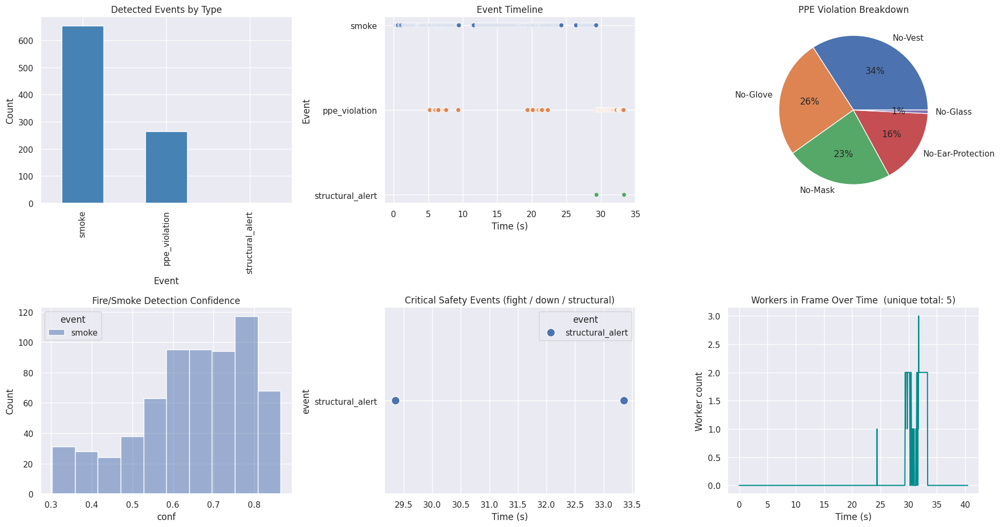

In [13]:

if event_log.empty:
    print("No events were logged on this clip/image — nothing to chart.")
else:
    non_count_events = event_log[event_log["event"] != "worker_count"]
    fig, axes = plt.subplots(2, 3, figsize=(19, 10))

    non_count_events["event"].value_counts().plot(kind="bar", ax=axes[0, 0], color="steelblue")
    axes[0, 0].set_title("Detected Events by Type")
    axes[0, 0].set_xlabel("Event"); axes[0, 0].set_ylabel("Count")

    sns.scatterplot(data=non_count_events, x="time_s", y="event", hue="event", ax=axes[0, 1], legend=False)
    axes[0, 1].set_title("Event Timeline")
    axes[0, 1].set_xlabel("Time (s)"); axes[0, 1].set_ylabel("Event")

    ppe_only = event_log[event_log["event"] == "ppe_violation"]
    if not ppe_only.empty:
        ppe_only["detail"].value_counts().plot(kind="pie", autopct="%1.0f%%", ax=axes[0, 2])
        axes[0, 2].set_ylabel(""); axes[0, 2].set_title("PPE Violation Breakdown")
    else:
        axes[0, 2].text(0.5, 0.5, "No PPE violations detected", ha="center"); axes[0, 2].axis("off")

    fs = event_log[event_log["event"].isin(["fire", "smoke"])]
    if not fs.empty:
        sns.histplot(data=fs, x="conf", hue="event", bins=10, ax=axes[1, 0])
        axes[1, 0].set_title("Fire/Smoke Detection Confidence")
    else:
        axes[1, 0].text(0.5, 0.5, "No fire/smoke detected", ha="center"); axes[1, 0].axis("off")

    critical = event_log[event_log["event"].isin(["fight", "worker_down", "structural_alert"])]
    if not critical.empty:
        sns.scatterplot(data=critical, x="time_s", y="event", hue="event", s=120, ax=axes[1, 1])
        axes[1, 1].set_title("Critical Safety Events (fight / down / structural)")
        axes[1, 1].set_xlabel("Time (s)")
    else:
        axes[1, 1].text(0.5, 0.5, "No fight / worker-down / structural alerts", ha="center"); axes[1, 1].axis("off")

    if not LAST_WORKER_COUNT_HISTORY.empty:
        axes[1, 2].plot(LAST_WORKER_COUNT_HISTORY["time_s"], LAST_WORKER_COUNT_HISTORY["count"], color="darkcyan")
        axes[1, 2].set_title(f"Workers in Frame Over Time  (unique total: {LAST_UNIQUE_WORKER_COUNT})")
        axes[1, 2].set_xlabel("Time (s)"); axes[1, 2].set_ylabel("Worker count")
    else:
        wc = event_log[event_log["event"] == "worker_count"]
        if not wc.empty:
            axes[1, 2].text(0.5, 0.5, f"Workers in image: {wc.iloc[0]['detail']}", ha="center", fontsize=14)
        axes[1, 2].axis("off")

    plt.tight_layout()
    plt.savefig(os.path.join(WORKDIR, "event_dashboard.png"), dpi=150)
    plt.show()


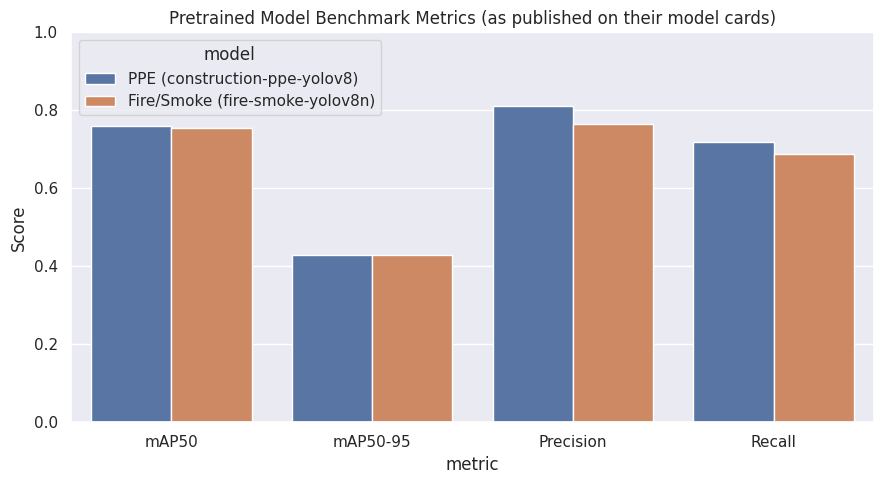

Note: the fight-detection and fallen-worker models don't publish formal mAP/precision/
recall numbers, so validate them on a sample of your own footage before trusting them.


In [14]:

# Published model-card metrics for the two benchmarked models (real numbers from their HF model
# cards). The fight and fall models are community-trained without a formally published
# benchmark, so they are intentionally left off this chart rather than inventing numbers.
metrics_df = pd.DataFrame({
    "model": ["PPE (construction-ppe-yolov8)"] * 4 + ["Fire/Smoke (fire-smoke-yolov8n)"] * 4,
    "metric": ["mAP50", "mAP50-95", "Precision", "Recall"] * 2,
    "value": [0.76, 0.43, 0.81, 0.72,   0.754, 0.430, 0.766, 0.688],
})

plt.figure(figsize=(9, 5))
sns.barplot(data=metrics_df, x="metric", y="value", hue="model")
plt.ylim(0, 1)
plt.title("Pretrained Model Benchmark Metrics (as published on their model cards)")
plt.ylabel("Score")
plt.tight_layout()
plt.savefig(os.path.join(WORKDIR, "model_benchmark.png"), dpi=150)
plt.show()
print("Note: the fight-detection and fallen-worker models don't publish formal mAP/precision/")
print("recall numbers, so validate them on a sample of your own footage before trusting them.")


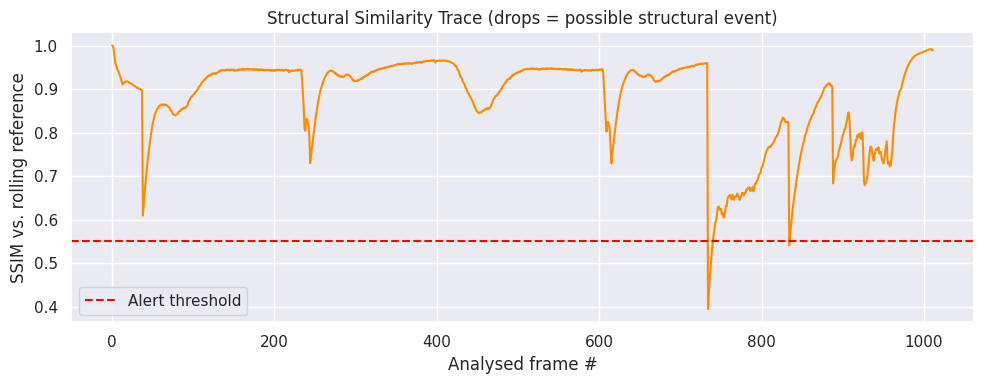

In [15]:

if LAST_STRUCT_DETECTOR is None or len(LAST_STRUCT_DETECTOR.ssim_history) < 2:
    print("Run the video pipeline (Cell 9) successfully on a video file to see the structural SSIM trace.")
else:
    plt.figure(figsize=(10, 4))
    plt.plot(LAST_STRUCT_DETECTOR.ssim_history, color="darkorange")
    plt.axhline(STRUCTURAL_SSIM_DROP_THRESHOLD, color="red", linestyle="--", label="Alert threshold")
    plt.title("Structural Similarity Trace (drops = possible structural event)")
    plt.xlabel("Analysed frame #"); plt.ylabel("SSIM vs. rolling reference")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(WORKDIR, "structural_ssim_trace.png"), dpi=150)
    plt.show()


## 12. Save the event log and all outputs

In [16]:

csv_path = os.path.join(WORKDIR, "event_log.csv")
event_log.to_csv(csv_path, index=False)
print("Saved:")
for f in glob.glob(os.path.join(WORKDIR, "*")):
    print(" -", f)


Saved:
 - /kaggle/working/_normalized_input.mp4
 - /kaggle/working/event_log.csv
 - /kaggle/working/model_benchmark.png
 - /kaggle/working/structural_ssim_trace.png
 - /kaggle/working/annotated_output_h264.mp4
 - /kaggle/working/runs
 - /kaggle/working/event_dashboard.png
 - /kaggle/working/annotated_output.mp4
 - /kaggle/working/pipeline_architecture.png
 - /kaggle/working/Huge explosion destroys Chinese building.mp4


## 13. Limitations & how to extend this project

* **PPE + fire/smoke** detectors are genuine pretrained YOLOv8 weights with published benchmarks
  (~0.75 mAP50) — solid for a portfolio/capstone project, not certified safety equipment.
* **Fight and fallen-worker** detectors are real pretrained models, but community-trained
  without a formally published accuracy benchmark. Validate them on a sample of your own
  footage and adjust `CONF_THRESH_FIGHT` / `CONF_THRESH_FALL` before trusting the alerts.
* **Worker counting** counts currently-visible tracked `Worker` boxes; heavy occlusion or people
  leaving and re-entering frame can cause the "unique workers in footage" number to over-count
  slightly (a re-appearing person may get a new track ID). For rigorous headcounts, a re-
  identification (Re-ID) model would reduce this.
* **Worker inactivity** is a logic layer (tracking + stillness timer) on the PPE model's
  `Worker` class, not a separately trained model.
* **Structural/collapse detection remains the weakest link by design of the current public-data
  landscape**: it's a transparent SSIM tripwire, not a trained classifier. Swap
  `StructuralAnomalyDetector.update()` for a `model.predict()` call the moment you have (or find)
  a labeled collapse/crack dataset — nothing else in the pipeline needs to change.
* To improve real-world accuracy further, fine-tune any of these models on footage from your
  own site: `model.train(data="your_data.yaml", epochs=30, device=0)`.
* For production: add RTSP/live-camera ingestion, a real alerting channel (SMS/Slack/email), and
  a human-review queue for the structural tripwire before any automated action is taken.
